In [1]:
%load_ext autoreload
%autoreload 2

import os
os.environ['KMP_WARNINGS'] = 'off'
import sys
import git

import uproot as ut
import awkward as ak
import numpy as np
import math
import vector
import sympy as sp

import re
from tqdm import tqdm
import timeit
import re

sys.path.append( git.Repo('.', search_parent_directories=True).working_tree_dir )
from utils import *

In [2]:
%load_ext line_profiler
%load_ext memory_profiler

In [3]:
# ntuple = "/eos/uscms/store/user/srosenzw/sixb/ntuples/Summer2018UL/maxbtag/NMSSM/NMSSM_XYH_YToHH_6b_MX_1000_MY_600/ntuple.root"
# model = "/uscms/home/srosenzw/nobackup/workarea/higgs/sixb_analysis/CMSSW_10_6_19_patch2/src/sixb/weaver-multiH/weaver/models/exp_xy/XY_3H_reco_ranker/20230220_ranger_lr0.0047_batch1024__withbkg/"

In [4]:
module = fc.eightb.preselection.t8btag_minmass
feynnet_nognn = eightb.models.feynnet_no_gnn
feynnet = eightb.models.feynnet_bkg10_allsig

In [50]:
feynnet.cfg

{'bkg_loss_scale': 1.0,
 'gnn_higgs_m': 125,
 'gnn_jet_k': 2,
 'gnn_out': 128,
 'gnn_params': [32, 64, 96],
 'higgs_layer_params': [128, 64, 64],
 'higgs_ranker': {'mu': 125, 'multi': True, 'ranker': 'soft', 'sigma': 25},
 'jet_feature_dims': 5,
 'jet_layer_params': [32],
 'rank_layer_params': [64, 64],
 'x_layer_params': [64, 64],
 'y_layer_params': [64, 64, 64],
 'y_ranker': None}

In [41]:
import re

re_state = re.compile(r'network_epoch-\d+_state.pt')
(
len([ f for f in os.listdir(feynnet.path) if re_state.match(f) ]),
len([ f for f in os.listdir(feynnet_nognn.path) if re_state.match(f) ]),
)


(100, 20)

In [5]:
altfile='{base}'
feynnet_sig = ObjIter([Tree(f, altfile=altfile, report=False) for f in tqdm(module.signal_list)])
feynnet_nognn_sig = ObjIter([Tree(f, altfile=altfile, report=False) for f in tqdm(module.signal_list)])

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:06<00:00,  2.07s/it]


In [7]:
feynnet_sig.apply(lambda t : eightb.load_yy_quadh_ranker(t, feynnet.path))

feynnet_nognn_sig.apply(lambda t : eightb.load_yy_quadh_ranker(t, feynnet_nognn.path))



[None, None, None]

In [8]:
for s in feynnet_nognn_sig:
    s.sample = f'No GNN {s.mass}'

In [9]:
for s in feynnet_sig:
    s.sample = f'GNN {s.mass}'

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.49s/it]


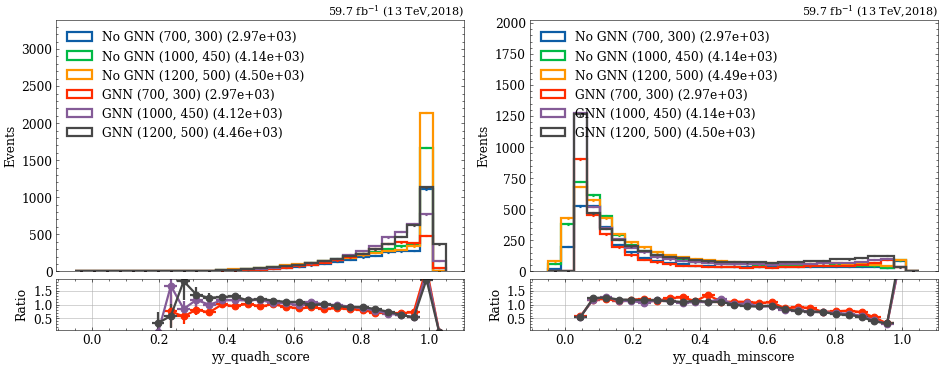

In [10]:
study.quick(
    feynnet_nognn_sig + feynnet_sig,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['yy_quadh_score','yy_quadh_minscore'],
    binlist=[(-0.05,1.05,30)]*3,
    
    ratio=True, r_group=[(0,3),(1,4),(2,5)]
)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:03<00:00,  2.23it/s]


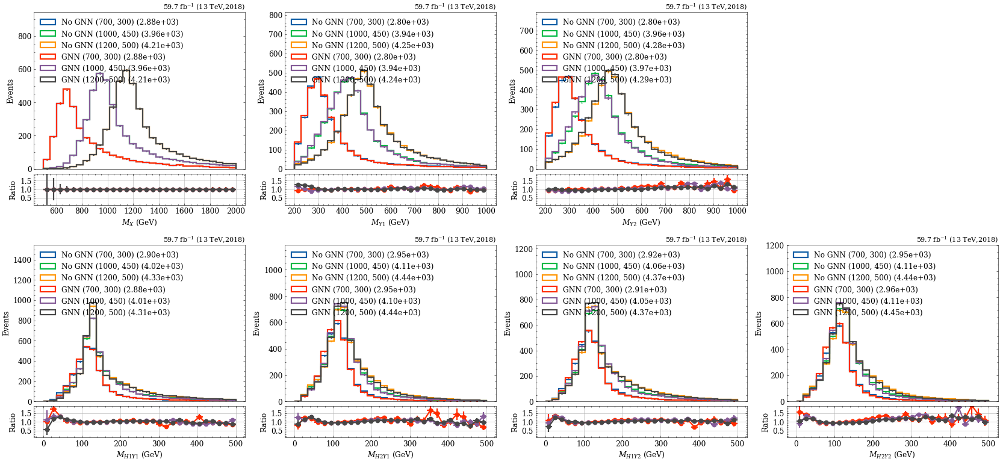

In [54]:
study.quick(
    feynnet_nognn_sig + feynnet_sig,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['X_m','Y1_m','Y2_m',None,'H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],

    ratio=True, r_group=[(0,3),(1,4),(2,5)]
)

In [12]:
def fully_reconstructed(t):
            h_b_ids = [ t[f'{quark}_signalId'] // 2 for quark in eightb.quarklist ]
            y_h_ids = [ ak.where(h_b1_id == h_b2_id, h_b1_id, -1) // 2 for h_b1_id, h_b2_id in zip(h_b_ids[::2], h_b_ids[1::2]) ]
            y1_id, y2_id = [ ak.where(y_h1_id == y_h2_id, y_h1_id, -1) // 2 for y_h1_id, y_h2_id in zip(y_h_ids[::2], y_h_ids[1::2]) ]
            reco_id = ak.where(y1_id == y2_id, y1_id, -1)
            t.extend(
                reco_id = reco_id
            )
(feynnet_nognn_sig+feynnet_sig).apply(fully_reconstructed)

[None, None, None, None, None, None]

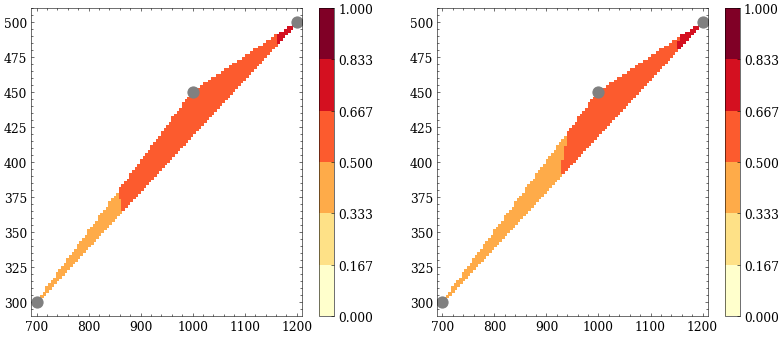

In [16]:
fig, axs = study.get_figax(nvar=2)

study.mxmy_phase(
    feynnet_nognn_sig,
    lambda t : ak.mean( t.reco_id[t.nfound_select==8]>-1 ),
    zlim=np.linspace(0,1,7),
    xlim=(690,1210),
    ylim=(290,510),

    figax=(fig,axs[0])
)

study.mxmy_phase(
    feynnet_sig,
    lambda t : ak.mean( t.reco_id[t.nfound_select==8]>-1 ),
#     g_cmap='YlGnBu',
    zlim=np.linspace(0,1,7),
    xlim=(690,1210),
    ylim=(290,510),

    figax=(fig,axs[1])
)

In [22]:
feynnet_nognn_sig.mass

['(700, 300)', '(1000, 450)', '(1200, 500)']

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17.00it/s]


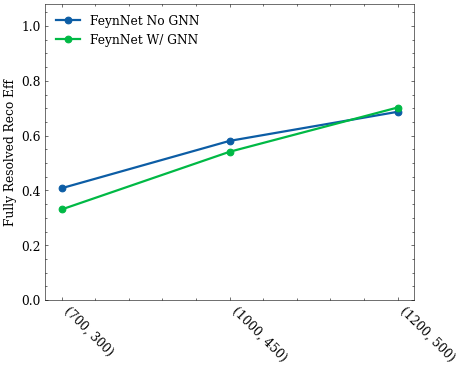

In [31]:
figax = study.get_figax()

study.statsplot(
    feynnet_nognn_sig,
    label=feynnet_sig.mass.list,
    masks=lambda t:t.nfound_select==8,
    legend=True,
    efficiency=True,
    varlist=['reco_id'],
    xlabels=['Fully Resolved Reco Eff'],
    
    stat=lambda h : h.histo[-1],
    g_g_label='FeynNet No GNN',
    
    figax=figax,

)

study.statsplot(
    feynnet_sig,
    label=feynnet_sig.mass.list,
    masks=lambda t:t.nfound_select==8,
    legend=True,
    efficiency=True,
    varlist=['reco_id'],
    xlabels=['Fully Resolved Reco Eff'],
    
    stat=lambda h : h.histo[-1],
    g_g_label='FeynNet W/ GNN',
    
    g_legend=True,
    figax=figax,

)

In [42]:
altfile='{base}'
feynnet_qcd = ObjIter([Tree(module.Run2_UL18.QCD_B_List, altfile=altfile)])
feynnet_nognn_qcd = ObjIter([Tree(module.Run2_UL18.QCD_B_List, altfile=altfile)])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:10<00:00,  1.51it/s]


In [43]:
feynnet_nognn_qcd.apply(lambda t : eightb.load_yy_quadh_ranker(t, feynnet_nognn.path))


[None]

In [44]:
feynnet_qcd.apply(lambda t : eightb.load_yy_quadh_ranker(t, feynnet.path))


[None]

In [45]:
for q in feynnet_nognn_qcd:
    q.sample = f'No GNN QCD'

In [46]:
for q in feynnet_qcd:
    q.sample = f'GNN QCD'

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  7.94it/s]


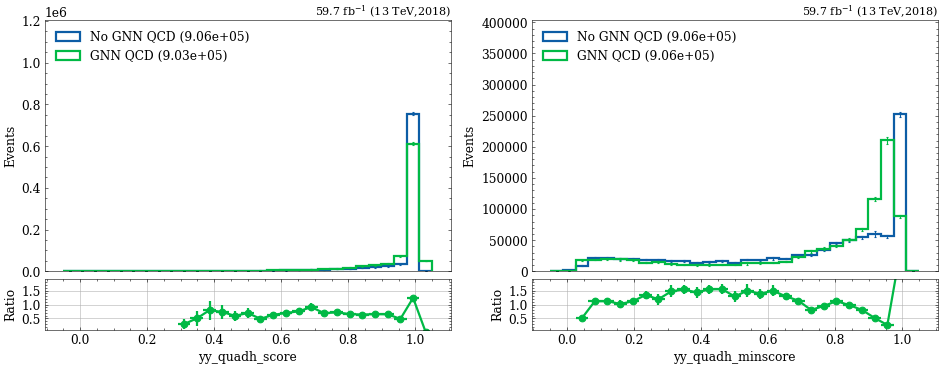

In [47]:
study.quick(
    feynnet_nognn_qcd + feynnet_qcd,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['yy_quadh_score','yy_quadh_minscore'],

    binlist=[(-0.05,1.05,30)]*3,
    ratio=True
)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.32it/s]


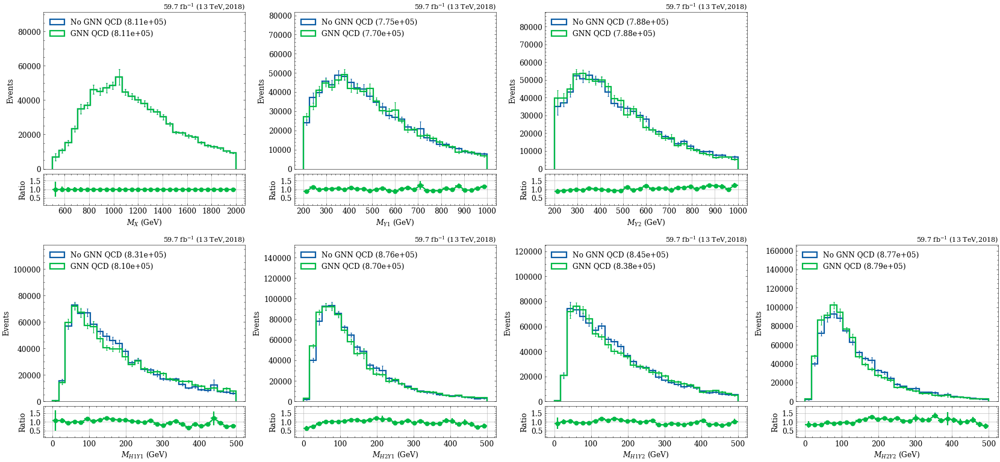

In [53]:
study.quick(
    feynnet_nognn_qcd + feynnet_qcd,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['X_m','Y1_m','Y2_m',None,'H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],

    ratio=True
)

In [51]:
def Y_Hmd(t, Y='Y1'):
    H1_m = t[f'H1{Y}_m']
    H2_m = t[f'H2{Y}_m']
    
    Hmd = np.sqrt( (H1_m-125)**2 + (H2_m-125)**2 )
    return Hmd

In [ ]:
study.quick(
    feynnet_nognn_qcd + feynnet_qcd,
    masks=lambda t : ( Y_Hmd(t, 'Y1') < 125/2 ) & ( Y_Hmd(t, 'Y2') < 125/2 ),
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['X_m','Y1_m','Y2_m',None,'H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],

    ratio=True
)

 12%|███████████████████████████████▉                                                                                                                                                                                                                               | 1/8 [00:00<00:02,  2.70it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [02:34<00:00,  3.16s/it]


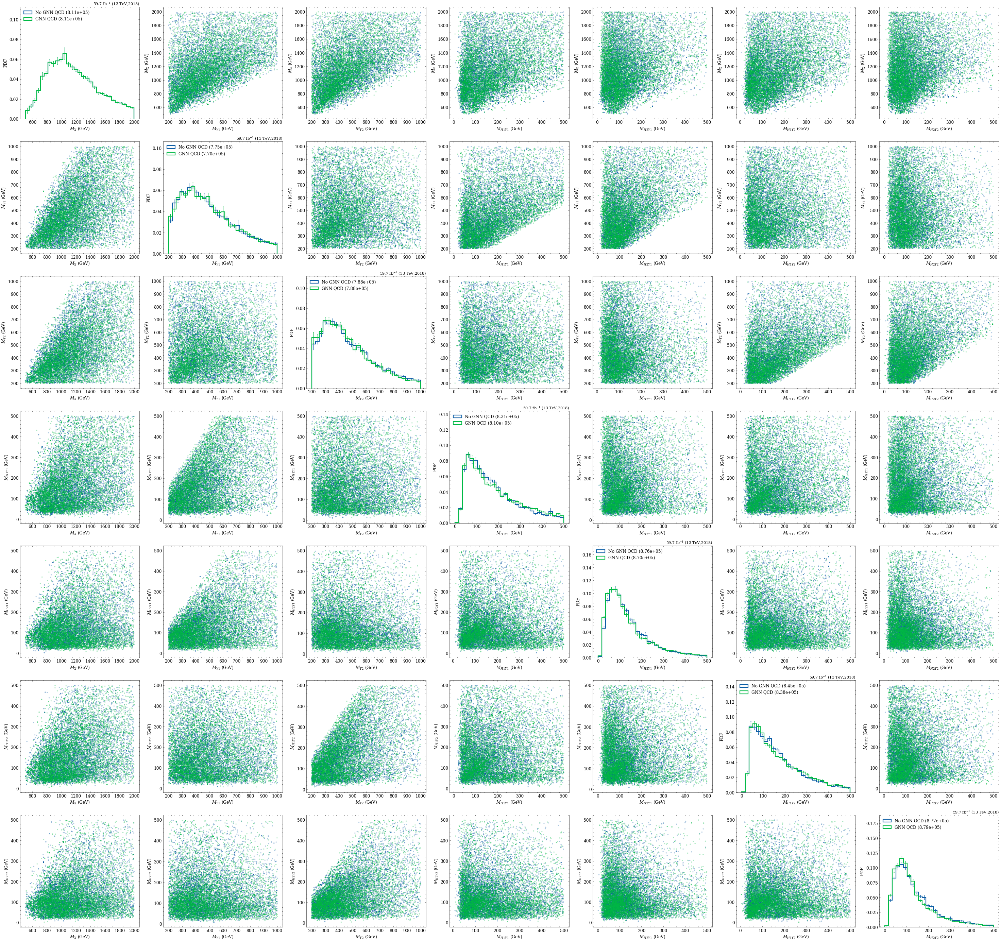

In [49]:
study.pairplot(
    feynnet_nognn_qcd + feynnet_qcd,
    stacked=False,
    h_color=None,
    legend=True,
    varlist=['X_m','Y1_m','Y2_m','H1Y1_m','H2Y1_m','H1Y2_m','H2Y2_m'],
)